![jezael-melgoza-KbR06h9dNQw-unsplash_scaled.png](attachments/175508067.png)
Photo by Jezael Melgoza on Unsplash

# Noise attenuation


When using speech technology in realistic environments, such as at home,
office or in a car, there will invariably be also other sounds present
and not only the speech sounds of desired speaker. There will be the
background hum of computers and air conditioning, cars honking, other
speakers, and so on. Such sounds reduces the quality of the desired
signal, making it more strenuous to listen, more difficult to understand
or at the worst case, it might render the speech signal unintelligible.
A common feature of these sounds is however that they are *independent*
of and *uncorrelated* with the desired signal. {cite:p}`benesty2008springer`

That is, we can usually assume that such noises are *additive*, such
that the observed signal $y$ is the sum of the desired signal $x$ and
interfering noises $v$, that is, $y=x+v$. To improve the quality of the
observed signal, we would like to make an estimate $ \hat x $ of
the desired signal $x$. The estimate should approximate the desired
signal $ x\approx \hat x $ or conversely, we would like to
minimize the distance $ d\left(x,\hat x\right) $ with some
distance measure $d(\cdot,\cdot)$.




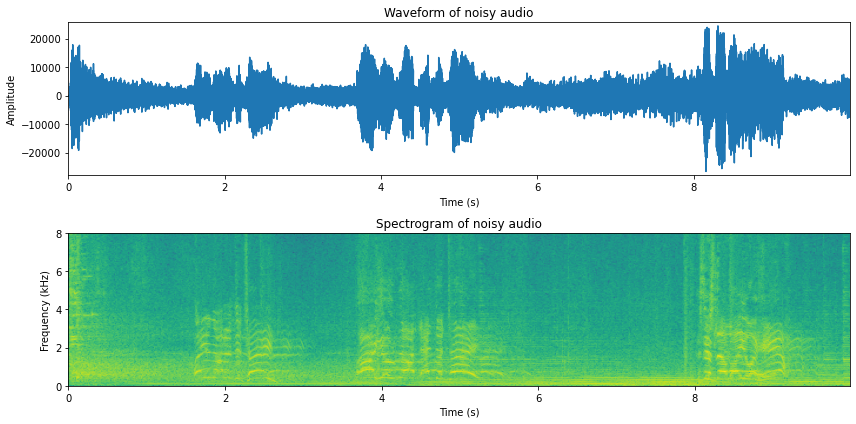

In [1]:
# Initialization for all
from scipy.io import wavfile
import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipd
from helper_functions import stft, istft, halfsinewindow

fs = 44100  # Sample rate
seconds = 5  # Duration of recording
window_length_ms=30
window_step_ms=15
window_length = int(window_length_ms*fs/2000)*2
window_step_samples = int(window_step_ms*fs/1000)

windowing_function = halfsinewindow(window_length)

filename = 'sounds/enhancement_test.wav'


# read from storage
fs, data = wavfile.read(filename)
data = data[:]

ipd.display(ipd.Audio(data,rate=fs))

plt.figure(figsize=[12,6])
plt.subplot(211)
t = np.arange(0,len(data),1)/fs

plt.plot(t,data)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform of noisy audio')
plt.axis([0, len(data)/fs, 1.05*np.min(data), 1.05*np.max(data)])


spectrogram_matrix = stft(data,
                          fs,
                          window_length_ms=window_length_ms,
                          window_step_ms=window_step_ms,
                         windowing_function=windowing_function)
fft_length = spectrogram_matrix.shape[1]
window_count = spectrogram_matrix.shape[0]
length_in_s = window_count*window_step_ms/1000
plt.subplot(212)
plt.imshow(20*np.log10(np.abs(spectrogram_matrix[:,range(fft_length)].T)),
           origin='lower',aspect='auto',
           extent=[0, length_in_s, 0, fs/2000])
plt.axis([0, length_in_s, 0, 8])
plt.xlabel('Time (s)')
plt.ylabel('Frequency (kHz)');
plt.title('Spectrogram of noisy audio')
plt.tight_layout()
plt.show()



## Noise gate

Suppose you are talking in a reasonably quiet environement. For example, typically when you speak on a phone, you would go to a quiet room. Similarly, when attending an on-line lecture, you would most often want to be in a room without background noise. 

What we perceive as quiet is however never entirely silent. When we play a sound recorded in a "quiet" room, then in the reproduction you then hear the *local* and the *recorded* background noises. Assuming the two noises have similar energies, then their sum has twice the energy, viz. 6dB higher than the original noises. In a teleconference with multiple participants, the background noises add up such that each contributes with an 6dB increase in the background noise level. You do not need many participants before the total noise level becomes so high that communication is impossible.

The **mute**-button in teleconferences is therefore essential. Participants can silence their microphones whenever they are not speaking, such that only the background noise of the *active* speaker(s) is transmitted to all listeners.

While the mute-button is a good user-interface in the sense that it gives control to the user, it is however an annoying user-interface in that users tend to forget to mute and unmute themselves. Would be better with an automatic mute.

**Noise gating** is a simple auto-mute in the sense that it thresholds signal energy and turns reproduction/transmission off if energy is too low. Typically it also features a hysterisis functionality such that reproduction/transmission is kept off for a while after the last speech segment. Moreover, to avoid discontinuities, there is a fade-in/fade-out functionality at the start and end. 

Note that noise gating with a energy threshold is a simple implementation of a *voice activity detector (VAD)*. With more advanced features than mere energy we can refine voice activity detects quite a bit, to make them more robust especially in noisy and reverberant environments. In addition to enhancement of signal quality, such methods are often used also to preserve resources, such as transmission bandwidth (telecommunication) and computation costs (recognition applications such as speech recognition).

For the noise-gate, we first need to choose a threshold. Typically that the threshold is chosen relative to the mean (log) energy $\sigma^2$ such that the threshold is $x^2 < \sigma^2\gamma$, where $\gamma$ is a tunable parameter. Moreover, we can implement the gate such that if we are below the threshold, we set a gain value to 0 and otherwise to 1. If we want fade-in/fade-out, we can ramp that gain value smoothly from 0 to 1 at the attack and from 1 to 0 at the release.

In [2]:
frame_energy = np.sum(np.abs(spectrogram_matrix)**2,axis=1)
frame_energy_dB = 10*np.log10(frame_energy)
mean_energy_dB = np.mean(frame_energy_dB) # mean of energy in dB

threshold_dB = mean_energy_dB + 3. # threshold relative to mean

speech_active = frame_energy_dB > threshold_dB

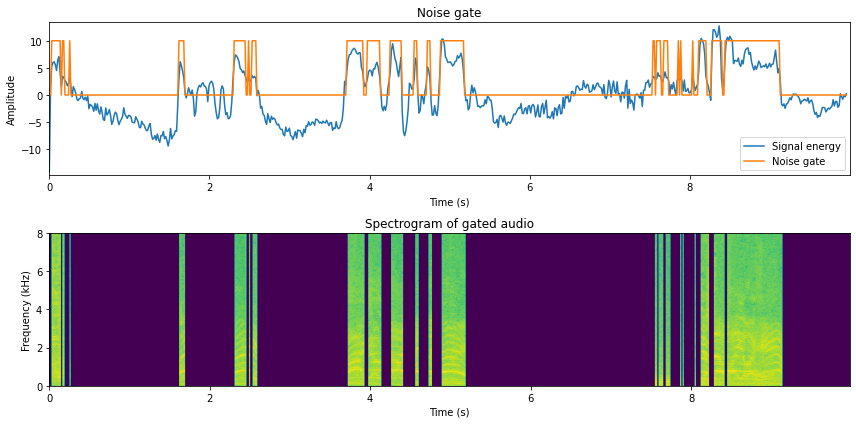

In [3]:
# Reconstruct and play thresholded signal
spectrogram_thresholded = spectrogram_matrix * np.expand_dims(speech_active,axis=1)
data_thresholded = istft(spectrogram_thresholded,fs,window_length_ms=window_length_ms,window_step_ms=window_step_ms,windowing_function=windowing_function)

# Illustrate thresholding (without hysteresis)
plt.figure(figsize=[12,6])
plt.subplot(211)

t = np.arange(0,window_count,1)*window_step_samples/fs
normalized_frame_energy = frame_energy_dB - np.mean(frame_energy_dB)
plt.plot(t,normalized_frame_energy,label='Signal energy')
plt.plot(t,speech_active*10,label='Noise gate')
plt.legend()
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Noise gate')
plt.axis([0, len(data)/fs, 1.05*np.min(normalized_frame_energy), 1.05*np.max(normalized_frame_energy)])


plt.subplot(212)

plt.imshow(20*np.log10(1e-6+np.abs(spectrogram_thresholded[:,range(fft_length)].T)),
           origin='lower',aspect='auto',
           extent=[0, length_in_s, 0, fs/2000])
plt.axis([0, length_in_s, 0, 8])
plt.xlabel('Time (s)')
plt.ylabel('Frequency (kHz)');
plt.title('Spectrogram of gated audio')
plt.tight_layout()
plt.show()
#sd.play(data_thresholded,fs)
ipd.display(ipd.Audio(data_thresholded,rate=fs))



This is quite awful isn't it? Though we did loose many stationary segments of noise, we also distorted the speech signal significantly. In particular, typically we loose plosives at the beginning of words. Overall the sound also sounds odd when it turns on an off again.

In [4]:
hysteresis_time_ms = 300
hysteresis_time = int(hysteresis_time_ms/window_step_ms)

speech_active_hysteresis = np.zeros([window_count])
for window_ix in range(window_count):
    range_start = max(0,window_ix-hysteresis_time)
    speech_active_hysteresis[window_ix] = np.max(speech_active[range(range_start,window_ix+1)])

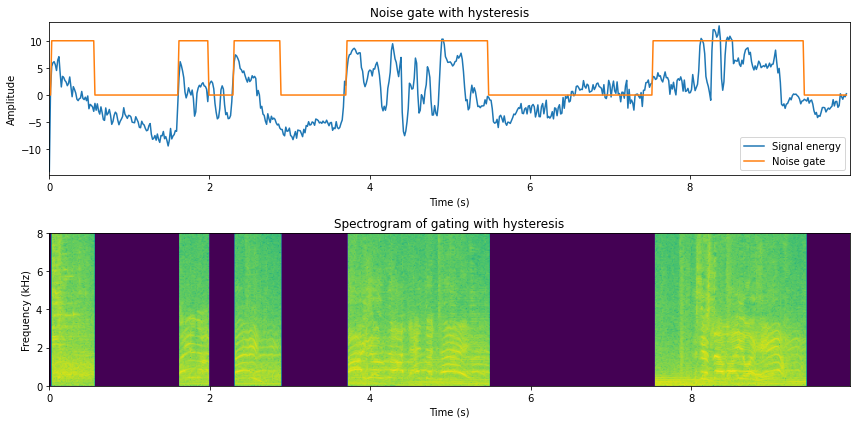

In [5]:
# Reconstruct and play thresholded signal
spectrogram_hysteresis = spectrogram_matrix * np.expand_dims(speech_active_hysteresis,axis=1)
data_hysteresis = istft(spectrogram_hysteresis,fs,window_length_ms=window_length_ms,window_step_ms=window_step_ms,windowing_function=windowing_function)

# Illustrate thresholding (without hysteresis)
plt.figure(figsize=[12,6])
plt.subplot(211)

t = np.arange(0,window_count,1)*window_step_samples/fs
normalized_frame_energy = frame_energy_dB - np.mean(frame_energy_dB)
plt.plot(t,normalized_frame_energy,label='Signal energy')
plt.plot(t,speech_active_hysteresis*10,label='Noise gate')
plt.legend()
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Noise gate with hysteresis')
plt.axis([0, len(data)/fs, 1.05*np.min(normalized_frame_energy), 1.05*np.max(normalized_frame_energy)])


plt.subplot(212)

plt.imshow(20*np.log10(1e-6+np.abs(spectrogram_hysteresis[:,range(fft_length)].T)),
           origin='lower',aspect='auto',
           extent=[0, length_in_s, 0, fs/2000])
plt.axis([0, length_in_s, 0, 8])
plt.xlabel('Time (s)')
plt.ylabel('Frequency (kHz)');
plt.title('Spectrogram of gating with hysteresis')
plt.tight_layout()
plt.show()
#sd.play(data_thresholded,fs)
ipd.display(ipd.Audio(data_hysteresis,rate=fs))



This sounds quite a bit better already. There are only some sudden muted areas (depending on your sound sample), but overall the sound is clearly better.

In [6]:
# Fade-in and fade-out
fade_in_time_ms = 50
fade_out_time_ms = 300
fade_in_time = int(fade_in_time_ms/window_step_ms)
fade_out_time = int(fade_out_time_ms/window_step_ms)

speech_active_sloped = np.zeros([window_count])
for frame_ix in range(window_count):
    if speech_active_hysteresis[frame_ix]:
        range_start = max(0,frame_ix-fade_in_time)
        speech_active_sloped[frame_ix] = np.mean(speech_active_hysteresis[range(range_start,frame_ix+1)])
    else:
        range_start = max(0,frame_ix-fade_out_time)
        speech_active_sloped[frame_ix] = np.mean(speech_active_hysteresis[range(range_start,frame_ix+1)])

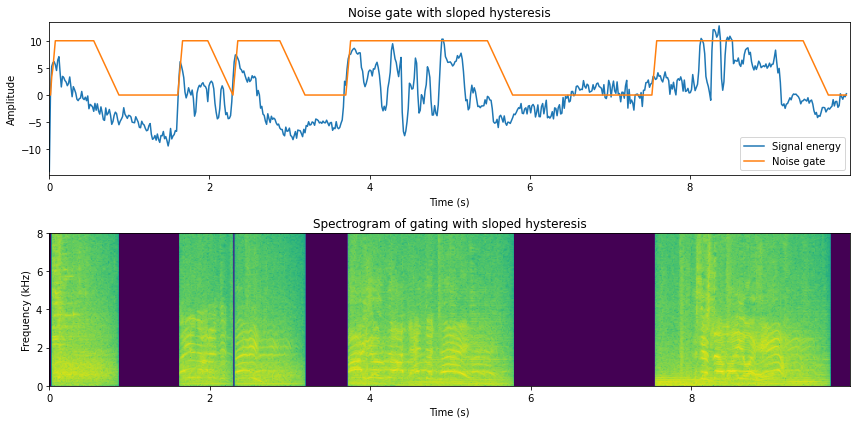

In [7]:
# Reconstruct and play sloped-thresholded signal
spectrogram_sloped = spectrogram_matrix * np.expand_dims(speech_active_sloped,axis=1)
data_sloped = istft(spectrogram_sloped,fs,window_length_ms=window_length_ms,window_step_ms=window_step_ms,windowing_function=windowing_function)

# Illustrate thresholding 
plt.figure(figsize=[12,6])
plt.subplot(211)

t = np.arange(0,window_count,1)*window_step_samples/fs
normalized_frame_energy = frame_energy_dB - np.mean(frame_energy_dB)
plt.plot(t,normalized_frame_energy,label='Signal energy')
plt.plot(t,speech_active_sloped*10,label='Noise gate')
plt.legend()
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Noise gate with sloped hysteresis')
plt.axis([0, len(data)/fs, 1.05*np.min(normalized_frame_energy), 1.05*np.max(normalized_frame_energy)])


plt.subplot(212)

plt.imshow(20*np.log10(1e-6+np.abs(spectrogram_sloped[:,range(fft_length)].T)),
           origin='lower',aspect='auto',
           extent=[0, length_in_s, 0, fs/2000])
plt.axis([0, length_in_s, 0, 8])
plt.xlabel('Time (s)')
plt.ylabel('Frequency (kHz)');
plt.title('Spectrogram of gating with sloped hysteresis')
plt.tight_layout()
plt.show()
#sd.play(data_thresholded,fs)
ipd.display(ipd.Audio(data_sloped,rate=fs))



This doesn't sound all too bad! The sudden on- and off-sets are gone and the transitions to muted areas sound reasonably natural.

Now we have implemented gating for the full-band signal. Gating can be easily improved by band-wise -processing. Depending on the amount of processing you can afford, you could go all the way and applying gating on individual frequency-bins in the STFT. 

In [8]:
hysteresis_time_ms = 100
hysteresis_time = int(hysteresis_time_ms/window_step_ms)

fade_in_time_ms = 30
fade_out_time_ms = 60
fade_in_time = int(fade_in_time_ms/window_step_ms)
fade_out_time = int(fade_out_time_ms/window_step_ms)


# NB: This is a pedagogic, but very slow implementation since it involves multiple for-loops.
spectrogram_binwise = np.zeros(spectrogram_matrix.shape,dtype=complex)
for bin_ix in range(fft_length):
    bin_energy_dB = 10.*np.log10(np.abs(spectrogram_matrix[:,bin_ix])**2)
    mean_energy_dB = np.mean(bin_energy_dB) # mean of energy in dB
    threshold_dB = mean_energy_dB + 16. # threshold relative to mean
    speech_active = bin_energy_dB > threshold_dB
    
    speech_active_hysteresis = np.zeros_like(speech_active)
    for window_ix in range(window_count):
        range_start = max(0,window_ix-hysteresis_time)
        speech_active_hysteresis[window_ix] = np.max(speech_active[range(range_start,window_ix+1)])
        
    #speech_active_sloped = np.zeros_like(spe
    for frame_ix in range(window_count):
        if speech_active_hysteresis[frame_ix]:
            range_start = max(0,frame_ix-fade_in_time)
            speech_active_sloped[frame_ix] = np.mean(speech_active_hysteresis[range(range_start,frame_ix+1)])
        else:
            range_start = max(0,frame_ix-fade_out_time)
            speech_active_sloped[frame_ix] = np.mean(speech_active_hysteresis[range(range_start,frame_ix+1)])
            
    spectrogram_binwise[:,bin_ix] = spectrogram_matrix[:,bin_ix]*speech_active_sloped

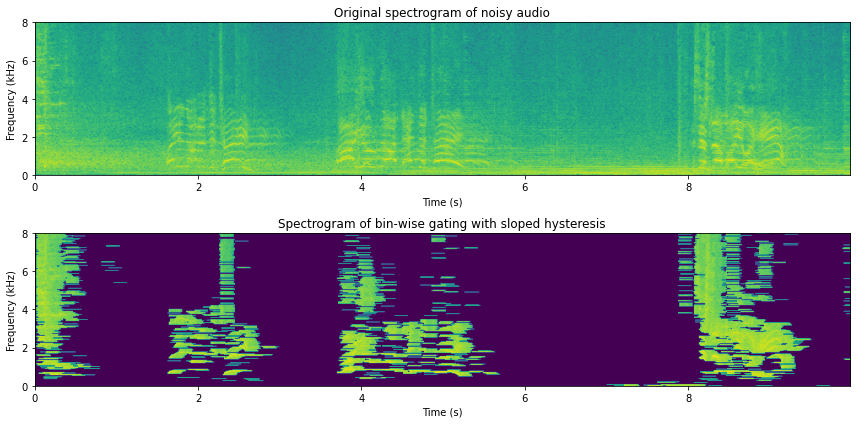

In [9]:
# Reconstruct and play sloped-thresholded signal
data_binwise = istft(spectrogram_binwise,fs,window_length_ms=window_length_ms,window_step_ms=window_step_ms,windowing_function=windowing_function)

# Illustrate thresholding 
plt.figure(figsize=[12,6])
plt.subplot(211)
plt.imshow(20*np.log10(np.abs(spectrogram_matrix[:,range(fft_length)].T)),
           origin='lower',aspect='auto',
           extent=[0, length_in_s, 0, fs/2000])
plt.axis([0, length_in_s, 0, 8])
plt.xlabel('Time (s)')
plt.ylabel('Frequency (kHz)');
plt.title('Original spectrogram of noisy audio')
ipd.display(ipd.Audio(data,rate=fs))

plt.subplot(212)
plt.imshow(20*np.log10(1e-6+np.abs(spectrogram_binwise[:,range(fft_length)].T)),
           origin='lower',aspect='auto',
           extent=[0, length_in_s, 0, fs/2000])
plt.axis([0, length_in_s, 0, 8])
plt.xlabel('Time (s)')
plt.ylabel('Frequency (kHz)');
plt.title('Spectrogram of bin-wise gating with sloped hysteresis')
plt.tight_layout()
plt.show()
#sd.play(data_thresholded,fs)
ipd.display(ipd.Audio(data_binwise,rate=fs))



This is clearly again a step better, but you should note two things:

- The parameters are now quite a bit different; hysteresis and ramps shorter as well as higher threshold. This was required to get acceptable quality.
- Some musical noise left in the low and high frequencies, where isolated areas are turned on for a while.

If possible, try listening to this sound with headphones and from loudspeakers. Is there a difference? Which one sounds better?

A possible impression is that, with good-quality headphones, the result is too clean. It sounds unnatural. With loudspeakers, however, it may sound quite ok. When listening to headphones, you better perceive the absence of background noise, whereas on the loudspeaker, there is more background noise present locally, such that the absence of reproduced background noise is not noticeable. With loudspeakers, any reproduced background noise would also interact with the local room, generating a double room reverberation (assuming that the reproduced loudspeaker sound already had reverberation). 

In any case, it seems therefore clear that muting the background noise entirely is not always desirable (at least when listening with headphones to a single speaker with background noise). We should therefore apply some more intelligent gain factor (see more in the spectral subtraction section below).

## Statistical model

The [STFT spectrum](../Representations/Spectrogram_and_the_STFT.ipynb) of a signal is a good
domain for noise attenuation because we can reasonably safely assume
that spectral components are uncorrelated with each other, such that we
treat each component separately. In other words, in the spectrum, we can
apply noise attenuation on every frequency bin with scalar operations,
whereas if the components would be correlated, we would have to use
vector and matrix operations. The benefit of scalar operations is that
they are computationally simple, $O(N)$, whereas matrix operations are
typically at least $O(N^2)$.

The sources are, according to our assumption, uncorrelated, which
    means that the expected correlation is zero,
    
$$E[xv] = 0.$$

A consequence of this assumption is that, for the mixture $y = x + v$, we have the energy expectation

$$E\left[y^2\right] = E\left[x+v^2\right] = E\left[x^2\right] + E\left[v^2\right] + 2E\left[xv\right]
= E\left[x^2\right] + E\left[v^2\right].$$
In other words, in terms of expectations, the energy is the sum of component energies, which will become a very practical property.

To find the energy of the speech signal, we then just need to estimate $E\left[v^2\right]$.
    
### Noise estimation and modelling
#### Mean-energy with voice activity detection

To be able to remove noise, we first need to estimate noise characteristics or statistics. We thus need to find sections of the signal which have noisy only (non-speech). One approach would be to use [voice activity detection](../Recognition/Voice_activity_detection.ipynb) (VAD) to find non-speech segments. Assuming we have a good VAD this can be effective. It works if we assume that noise is stationary, such that the noise on non-speech parts are similar to the noise in speech-parts. In general, VADs are accurate only at low noise levels.

In [10]:
%load_ext itikz

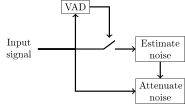

In [11]:
%%itikz --temp-dir --file-prefix dual-primary-
\documentclass{standalone}
\usepackage[utf8]{inputenc}
\usepackage{tikz}
\usepackage{verbatim}


\usepackage{pgfplots}
\DeclareUnicodeCharacter{2212}{−}
\usepgfplotslibrary{groupplots,dateplot}
\usetikzlibrary{patterns,shapes.arrows}
\usetikzlibrary {fit} 
\usetikzlibrary{shapes.geometric,positioning}
\usetikzlibrary{bending}
\pgfplotsset{compat=1.16}

\begin{document}


\begin{tikzpicture}
    \node at (0,0) (in) {\parbox{1.1cm}{\centering Input signal}};
    \node[draw] at (2,1.5) (vad) {VAD};
    \node[draw] at (5,0) (est) {\parbox{1.5cm}{\centering Estimate noise}};
    \node[draw] at (5,-1.5) (enh) {\parbox{1.5cm}{\centering Attenuate noise}};
    \draw[->,very thick] (in) -- (2,0) -- (2,-1.5) -- (enh);
    \draw[->,very thick] (in) -- (2,0) -- (vad);
    \draw[->,very thick] (est) -- (enh);
    \draw[very thick] (in) -- (3,0) -- (3.4,0.3);
    \draw[very thick,->] (3.4,0) -- (est);
    \draw[->,very thick] (vad) -- (3.2,1.5) -- (3.2,0.4);
\end{tikzpicture}

\end{document}

In [12]:
# VAD through energy thresholding
frame_energy = np.sum(np.abs(spectrogram_matrix)**2,axis=1)
frame_energy_dB = 10*np.log10(frame_energy)
mean_energy_dB = np.mean(frame_energy_dB) # mean of energy in dB

noise_threshold_dB = mean_energy_dB - 3. # threshold relative to mean

noise_active = frame_energy_dB < noise_threshold_dB

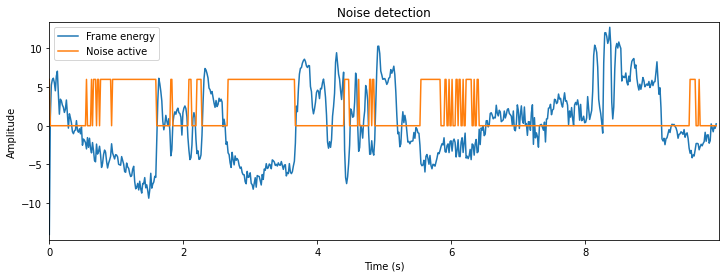

In [13]:
normalized_frame_energy = frame_energy_dB - mean_energy_dB

plt.figure(figsize=[12,4])
plt.plot(t,normalized_frame_energy,label='Frame energy')
plt.plot(t,noise_active*6,label='Noise active')
plt.legend()
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Noise detection')
plt.axis([0, len(data)/fs, 1.05*np.min(normalized_frame_energy), 1.05*np.max(normalized_frame_energy)])
plt.show()

In [14]:
# Estimate noise in noise frames
noise_frames = spectrogram_matrix[noise_active,:]
noise_estimate = np.mean(np.abs(noise_frames)**2,axis=0)

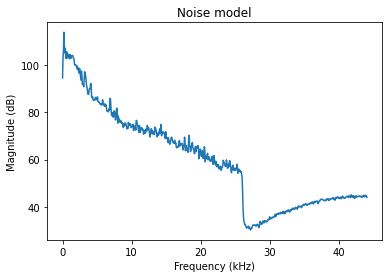

In [15]:
f = np.linspace(0,fs/1000,fft_length)
plt.plot(f,10*np.log10(1e-6+noise_estimate));
plt.xlabel('Frequency (kHz)')
plt.ylabel('Magnitude (dB)');
plt.title('Noise model');
plt.show()

In typical office environments and many other real-world scenarios, the background noise is dominated by low-frequencies, that is, the low frequencies have high energy. Often low quality hardware also leaks analog distortion into the microphone, such that there can be visible peaks in the higher frequencies. 

#### Minimum statistics
An alternative estimate would be the *minimum-statistics* estimate, where we take the minimum energy of each component over time. Since speech+noise has more energy than just noise alone, the minimum most likely represents only noise. {cite:p}`martin2001noise`

In [16]:
noise_estimate_minimum = np.min(np.abs(spectrogram_matrix)**2,axis=0)

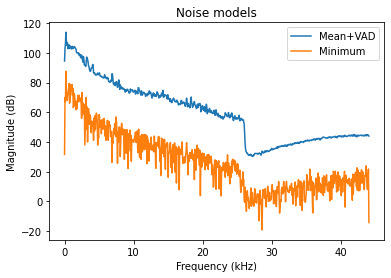

In [17]:
plt.plot(f,10*np.log10(noise_estimate),label='Mean+VAD');
plt.plot(f,10*np.log10(noise_estimate_minimum),label='Minimum');
plt.legend()
plt.xlabel('Frequency (kHz)')
plt.ylabel('Magnitude (dB)');
plt.title('Noise models');

We see that the minimum statistics estimate of noise is much lower than the mean. Duh, it is by definition lower. However, the shape of both spectra is the same. Thus, the minimum statistics estimate is biased, but preserves the shape. The bias is something we can correct by adding a fixed constant. The benefit of minimum statistics is that it does not depend on a threshold. We thus replace the threshold parameter by a bias parameter, which is much less prone to errors. 

In the following, we will use the mean as our noise model for simplicity.

## Spectral subtraction

The basic idea of spectral subtraction is that we assume that we have
access to an estimate of the noise energy $ E[\|v\|^2] = \sigma_v^2$ , and we subtract that from the energy of the observation, such that
we define the energy of our estimate as {cite:p}`boll1979suppression`

$$ \|\hat x\|^2 := \|y\|^2 - \sigma_v^2. $$

Unfortunately, since our estimate of noise energy is not perfect and
because we have hiddenly made an inaccurate assumption that $x$ and $v$
are uncorrelated, the above formula can give negative values for the
energy estimate. Negative energy is not realizable and nobody likes
pessimists, so we have to modify the formula to threshold at zero

$$ \|\hat x\|^2 := \begin{cases} \|y\|^2 - \sigma_v^2 & \text{if }
\|y\|^2 \geq \sigma_v^2 \\ 0 & \text{if } \|y\|^2 < \sigma_v^2
\end{cases}. $$

Since STFT spectra are complex-valued, we then still have to find the
complex angle of the signal estimate. If the noise energy is small $
\|v\|^2 \ll \|x\|^2 $ , then the complex angle of $x$ is
approximately equal to the angle of $y$, $ \angle x \approx \angle
y $ , such that our final estimate is (when $ \|y\|^2\geq
\sigma_v^2 $ )

$$ \hat x := \angle y \cdot \|\hat x\| = \frac{y}{\|y\|} \sqrt{
\|y\|^2 - \sigma_v^2} = y \sqrt{\frac{\|y\|^2 -
\sigma_v^2}{\|y\|^2}}. $$

In [18]:
energy_enhanced = np.subtract(np.abs(spectrogram_matrix)**2, np.expand_dims(noise_estimate,axis=0))
energy_enhanced *= (energy_enhanced > 0)  # threshold at zero
enhancement_gain = np.sqrt(energy_enhanced/(np.abs(spectrogram_matrix)**2))
spectrogram_enhanced = spectrogram_matrix*enhancement_gain;

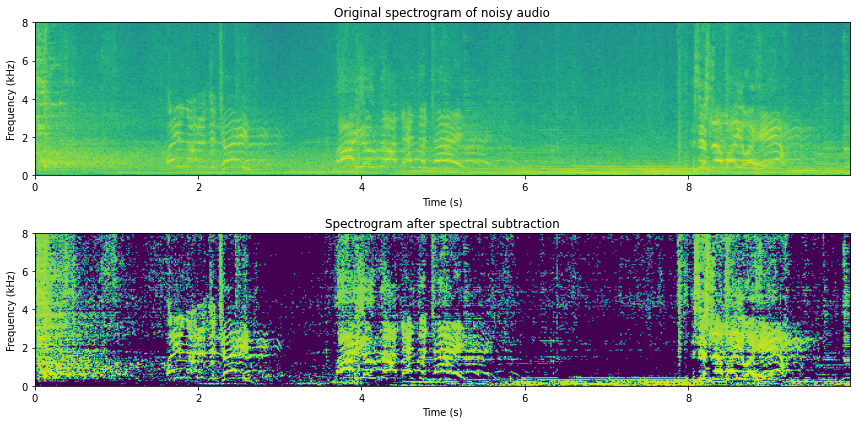

In [19]:
# Reconstruct and play sloped-thresholded signal
data_enhanced = istft(spectrogram_enhanced,fs,window_length_ms=window_length_ms,window_step_ms=window_step_ms,windowing_function=windowing_function)

# Illustrate thresholding 
plt.figure(figsize=[12,6])
plt.subplot(211)
plt.imshow(20*np.log10(np.abs(spectrogram_matrix[:,range(fft_length)].T)),
           origin='lower',aspect='auto',
           extent=[0, length_in_s, 0, fs/2000])
plt.axis([0, length_in_s, 0, 8])
plt.xlabel('Time (s)')
plt.ylabel('Frequency (kHz)');
plt.title('Original spectrogram of noisy audio')
ipd.display(ipd.Audio(data,rate=fs))

plt.subplot(212)
plt.imshow(20*np.log10(1e-6+np.abs(spectrogram_enhanced[:,range(fft_length)].T)),
           origin='lower',aspect='auto',
           extent=[0, length_in_s, 0, fs/2000])
plt.axis([0, length_in_s, 0, 8])
plt.xlabel('Time (s)')
plt.ylabel('Frequency (kHz)');
plt.title('Spectrogram after spectral subtraction')
plt.tight_layout()
plt.show()
#sd.play(data_thresholded,fs)
ipd.display(ipd.Audio(data_enhanced,rate=fs))



Typically spectral subtraction does improve the quality of the signal, but it also leaves room for improvement. In particular, usually we hear musical noise in the higher frequencies, which are components which alternate between on and off. Because these components appear independetly from the speech signal, they are perceived as independent sounds and because they are essentially isolated sinusoids, they are perceived as tones; thus we hear musical noisy "tones".

## Minimum-mean Square Estimate (MMSE) aka. Wiener filtering

Observe that the form of the relationship above is $ \hat x = y\cdot
g, $ where $g$ is a scalar scaling coefficient. Instead of the above
heuristic, we could then derive a formula which gives the smallest
error, for example in the minimum error energy expectation sense or
minimum mean square error (MMSE). Specifically, the error energy
expectation is

$$ E\left[\|e\|^2\right] = E\left[\|x-\hat x\|^2\right] =
E\left[\|x-gy\|^2\right] = E\left[\|x\|^2\right] + g^2
E\left[\|y\|^2\right] - 2g E\left[xy\right]. $$

If we assume that target speech and noise are uncorrelated, $
E\left[xv\right]=0 $ ,

then $
E\left[xy\right]=E\left[x(x+v)\right]=E\left[\|x\|^2\right]
$ and

$$ E\left[\|e\|^2\right] = E\left[\|x\|^2\right] + g^2
E\left[\|y\|^2\right] - 2g E\left[\|x\|^2\right] =
(1-2g)E\left[\|x\|^2\right] + g^2 E\left[\|y\|^2\right]. $$

The minimum is found by setting the derivative to zero

$$ 0 = \frac{\partial}{\partial g}E\left[\|e\|^2\right] =
-2E\left[\|x\|^2\right] + 2 g E\left[\|y\|^2\right], $$

such that the final solution is

$$ g = \frac{E\left[\|x\|^2\right]}{E\left[\|y\|^2\right]} =
\frac{E\left[\|y\|^2\right]-\sigma_v^2}{E\left[\|y\|^2\right]}.
$$

and the [Wiener estimate](https://en.wikipedia.org/wiki/Wiener_filter) becomes

$$ \hat x := y \left(\frac{\|y\|^2 - \sigma_v^2}{\|y\|^2}\right).
$$

Observe that this estimate is almost equal to the above, but the square
root is omitted. With different optimization criteria, we can easily
derive further such estimates. Such estimates have different weaknesses
and strengths and it is then a matter of application specific tuning to
choose the best estimate.

Overall, it is however somewhat unsatisfactory that *additive* noise is
attenuated with a *multiplicative* method. However, without a better
model of source and noise characteristics, this is probably the best we
can do. Still, spectral subtraction is a powerful method when taking
into account how simple it is. With minimal assumptions we obtain a
signal estimate which can give a clear improvement in quality.

In [20]:
mmse_gain = energy_enhanced/(np.abs(spectrogram_matrix)**2)
spectrogram_enhanced_mmse = spectrogram_matrix*mmse_gain

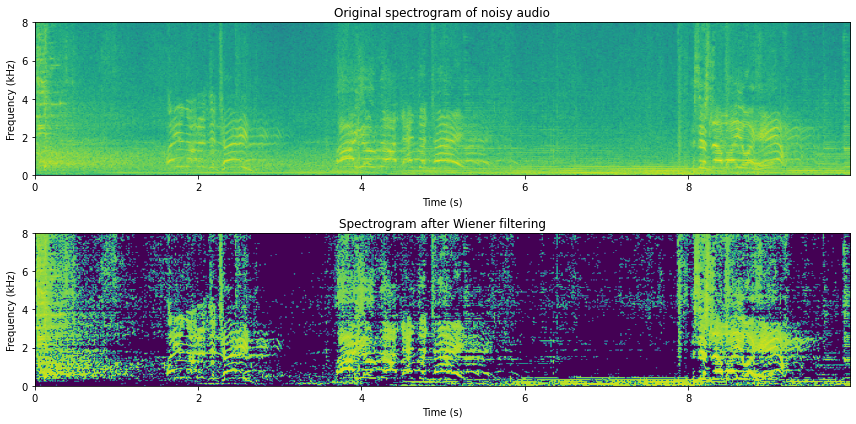

In [21]:
# Reconstruct and play enhanced signal
data_enhanced_mmse = istft(spectrogram_enhanced_mmse,fs,window_length_ms=window_length_ms,window_step_ms=window_step_ms,windowing_function=windowing_function)

# Illustrate thresholding 
plt.figure(figsize=[12,6])
plt.subplot(211)
plt.imshow(20*np.log10(np.abs(spectrogram_matrix[:,range(fft_length)].T)),
           origin='lower',aspect='auto',
           extent=[0, length_in_s, 0, fs/2000])
plt.axis([0, length_in_s, 0, 8])
plt.xlabel('Time (s)')
plt.ylabel('Frequency (kHz)');
plt.title('Original spectrogram of noisy audio')
ipd.display(ipd.Audio(data,rate=fs))

plt.subplot(212)
plt.imshow(20*np.log10(1e-6+np.abs(spectrogram_enhanced_mmse[:,range(fft_length)].T)),
           origin='lower',aspect='auto',
           extent=[0, length_in_s, 0, fs/2000])
plt.axis([0, length_in_s, 0, 8])
plt.xlabel('Time (s)')
plt.ylabel('Frequency (kHz)');
plt.title('Spectrogram after Wiener filtering')
plt.tight_layout()
plt.show()
#sd.play(data_thresholded,fs)
ipd.display(ipd.Audio(data_enhanced_mmse,rate=fs))



The quality of the MMSE estimate is not drastically different from the spectral subtraction algorithm. This is not surprising as the algorithms are very similar. 

In comparison to noise gating, we also notice that it may not be entirely clear which one is better. To a large extent, this will happen with good quality signals, where the SNR is high. With worse SNR, energy thresholding becomes more difficult and noise gating will surely fail. MMSE is more robust and therefore typically has better quality at low SNR. These methods can also be combined to give the best of both worlds.

### Treating musical noise

For spectral subtraction -type methods (which includes MMSE), we often encounter musical noise (described above). Similar problems are common in coding applications which use frequency-domain quantization. The problem is related to discontinuity in spectral components over time. Musical noise is perceived when spectral components are randomly turned on and off. 

The solution to musical noise must thus be to avoid components going on and off. 
Possible approaches include:

#### Noise filling
Spectral holes (zeros) can be avoided by a noise floor, where we add random noise any time spectral components are below a threshold.

#### Mapping
In spectral subtraction -type methods, the gain value was thresholded at zero before multiplication by the spectrum. It is this thresholding which causes the problem. Therefore, we could replace the hard threshold with a soft threshold. One such soft threshold is the soft-plus, defined for an input $x$ as $y=\ln\left(e^x+1\right)$.


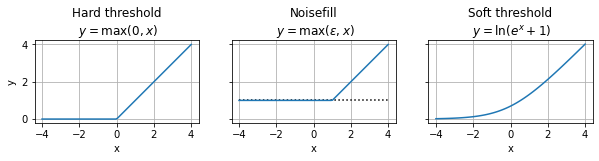

In [22]:
# Illustration of hard threshold, noise filling and soft threshold
noisefill_level = 1
x = np.linspace(-4,4,100)
f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True, figsize=[10,10])
ax1.plot(x,0.5*(x+np.abs(x)))
ax2.plot(x,x*0 + noisefill_level,'k:')
ax2.plot(x,noisefill_level+0.5*(x-noisefill_level+np.abs(x-noisefill_level)))
ax3.plot(x,np.log(1.+np.exp(x)))
ax1.set_title('Hard threshold\n $y=\max(0,x)$')
ax2.set_title('Noisefill\n $y=\max(\epsilon,x)$')
ax3.set_title('Soft threshold\n $y=\ln(e^x+1)$');
ax1.set_xlabel('x')
ax2.set_xlabel('x')
ax3.set_xlabel('x');
ax1.set_ylabel('y');
ax1.set_aspect('equal')
ax2.set_aspect('equal')
ax3.set_aspect('equal')
ax1.grid()
ax2.grid()
ax3.grid()
plt.show()

In [23]:
# Noise fill with min(eps,x)
noisefill_threshold_dB = -60   # dBs below average noise
noisefill_level = (10**(noisefill_threshold_dB/10))*noise_estimate  
#noisefill_level = 0.2

energy_enhanced = np.abs(spectrogram_matrix)**2 - noise_estimate

#energy_noisefill = noisefill_level + 0.5*(energy_enhanced - noisefill_level + np.abs(energy_enhanced - noisefill_level))
energy_noisefill = noisefill_level + ((energy_enhanced - noisefill_level) > 0) * (energy_enhanced - noisefill_level)
mmse_noisefill_gain = np.sqrt(energy_noisefill)/np.abs(spectrogram_matrix)
spectrogram_enhanced_noisefill = spectrogram_matrix*mmse_noisefill_gain;

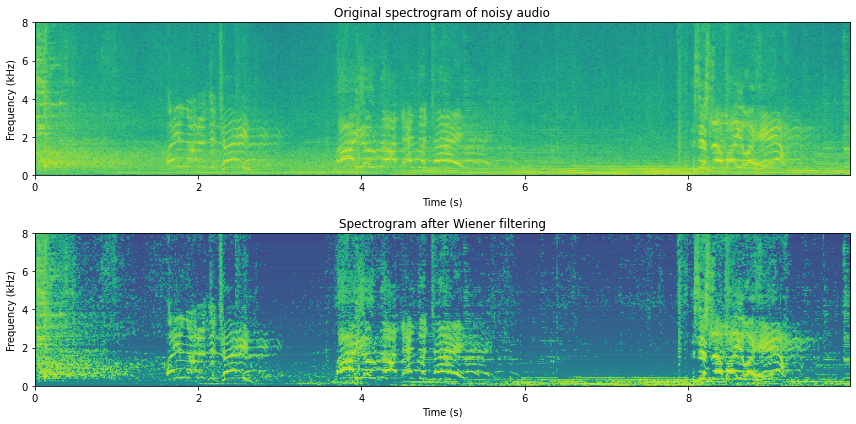

In [24]:
# Reconstruct and play enhanced signal
data_enhanced_noisefill = istft(spectrogram_enhanced_noisefill,fs,window_length_ms=window_length_ms,window_step_ms=window_step_ms,windowing_function=windowing_function)

# Illustrate thresholding 
plt.figure(figsize=[12,6])
plt.subplot(211)
plt.imshow(20*np.log10(np.abs(spectrogram_matrix[:,range(fft_length)].T)),
           origin='lower',aspect='auto',
           extent=[0, length_in_s, 0, fs/2000])
plt.axis([0, length_in_s, 0, 8])
plt.xlabel('Time (s)')
plt.ylabel('Frequency (kHz)');
plt.title('Original spectrogram of noisy audio')
ipd.display(ipd.Audio(data,rate=fs))

plt.subplot(212)
plt.imshow(20*np.log10(1e-6+np.abs(spectrogram_enhanced_noisefill[:,range(fft_length)].T)),
           origin='lower',aspect='auto',
           extent=[0, length_in_s, 0, fs/2000])
plt.axis([0, length_in_s, 0, 8])
plt.xlabel('Time (s)')
plt.ylabel('Frequency (kHz)');
plt.title('Spectrogram after Wiener filtering')
plt.tight_layout()
plt.show()
#sd.play(data_thresholded,fs)
ipd.display(ipd.Audio(data_enhanced_noisefill,rate=fs))



We find that noisefilling -type methods offer a compromise between amount of noise removed and the amount of musical noise. Usually we try to tune the parameter such that we are just above the level where musical noise is perceived, since it is a non-natural distortion and therefore more annoying than an incomplete noise attenuation. However, closer tuning is dependent on application and preference.

### Wiener filtering for vectors

Above we considered the scalar case, or conversely, the case where we
can treat components of a vector to be independent such that they can be
equivalently treated as a collection of scalars. In some cases, however,
we might be unable to find an uncorrelated representation of the signal
or the corresponding whitening process could be unfeasibly complex or it
can incur too much algorithmic delay. We then have to take into account
the correlation between components.

Consider for example a desired signal $ x\in{\mathbb R}^{N \times1}
$ , a noise signal $ v\in{\mathbb R}^{N \times1} $ and their
additive sum, the observation $ y = x+v, $ from which we want to
estimate the desired signal with a linear filter $ \hat x := a^H y.
$ Following the MMSE derivation above, we set the derivative of the
error energy expectation to zero

$$ \begin{split} 0&=\frac{\partial}{\partial
a}E\left[\|e\|^2\right] =\frac{\partial}{\partial
a}E\left[\|x-\hat x\|^2\right] =\frac{\partial}{\partial
a}E\left[\|x-a^H y\|^2\right] \\& =\frac{\partial}{\partial
a}E\left[\|x-a^H (x+v)\|^2\right] =2E\left[(x+v)\left(x-a^H
(x+v)\right)^H\right] \\& =2\left[ E[xx^H] - \left(E[xx^H] +
E[vv^H]\right)a\right] =2\left[ R_{xx} - \left(R_{xx} +
R_{vv}\right)a\right] \end{split} $$

Where the covariance matrices are $ R_{xx} = E[xx^H] $ and $
R_{vv} = E[vv^H] $ , and we used the fact that $x$ and $v$ are
uncorrelated $ E[xv^H]=0 $ . The solution is then clearly

$$ a=\left(R_{xx}+R_{vv}\right)^{-1} R_{xx} = R_{yy}^{-1}
\left(R_{yy}-R_{vv}\right), $$

where we for now assume that the inverse exists. This solution is
clearly similar to the MMSE solution for the scalar case.

A central weakness of this approach is that it involves a matrix
inversion, which is computationally complex operation, such that on-line
application is challenging. It furthermore requires that the covariance
matrix $R_{yy}$ is invertible (positive definite), which places
constraints on the methods for estimating such covariances.

In any case, Wiener filtering is a convenient method, because it
provides an analytical expression for an optimal solution in noise
attenuation. It consequently has very well documented properties and
performance guarantees.

## Masks, power spectra and temporal characteristics

As seen above, we can attenuate noise if we have a good estimate of the
noise energy. However, actually, both the spectral subtraction and
Wiener filtering methods use models of the speech and noise energies.
The models used above were rather heuristic; noise energy was assumed to
be "known" and speech energy was defined as energy of observation minus
noise energy. It is however not very difficult to make better models
than that. Before going to improved models, note that we did not use
speech and noise energies independently, but only their ratio. Now
clearly the ratio of speech and noise is the signal-to-noise ratio (SNR)
of that particular component. We thus obtain an estimate of the SNR of
the whole spectrum. Conversely, we would need only the SNR of the
spectrum to attenuate noise with the above methods. The SNR as a
function of frequency and time is often referred to as a *mask* and in
the following we will discuss some methods for generating such masks. It
is however important to understand that mask-based methods are operating
on the power (or magnitude) spectrum and thus do not include any models
of the complex phase. Indeed, efforts have in general focused mostly on
the power spectrum and much less on the phase. On one hand, the
motivation is that characteristics of the power spectrum are much more
important to perception than the phase (though the phase is also
important), but on the other hand, the power spectrum is also much
easier to work with than the phase. Therefore there has been both much
more demand and supply of methods which treat the power spectrum.

To model speech signals, we can begin by looking at spectral envelopes,
the high-level structure of the power spectrum. It is well-known that
the phonetic information of speech lies primarily in the shape of the
spectral envelope, and the lowest-frequency peaks of the envelope
identify the vowels uniquely. In other words, the distribution of
spectral energy varies smoothly across the frequencies. This is
something we can model and use to estimate the spectral mask. Similarly,
we know that phonemes vary slowly over time, which means that the
envelope varies slowly over time. Thus, again, we can model envelope
behaviour over time to generate spectral masks.

A variation of such masks is known as *binary* masks, where we can set,
for example, that the mask is 1 if speech energy is larger than noise
energy, and 0 otherwise. Clearly this is equivalent with thresholding
the SNR at unity (which is equivalent to 0 dB), such that an SNR-mask
can always be converted to a binary mask, but the reverse is not
possible. The benefit of binary masks is that it simplifies some
computations.

If we then want to attenuate noise in a particular frame of speech it is
then useful to use as much of the surrounding data (context) as
possible. For best quality, we can model, say, a second of the speech
signal both before and after the target frame. Though this can improve
quality of the estimate, this has two clear negative consequences. First
of all, including more data increases computational complexity. The
level of acceptable complexity is though highly dependent on the
application. Secondly, if we look into *future* frames to process the
current frame, then we have to have access to such data. In a on-line
system, this means that we have to wait for the whole look-ahead data to
arrive before processing, such that the overall system has a delay
corresponding to the length of the look-ahead. We can extrapolate the
current frame from past frames, but interpolating between past and
future frames does give much better quality. The amount of acceptable
delay is also an application dependent question.



## Machine learning methods

The first choice in designing machine learning methods for noise
attenuation and other speech enhancement tasks is the overall systems
architecture. The application is usually simply a neural network which
takes noisy speech as input and outputs an estimate of the clean speech.
A natural choice would then be to train the network with a large
database of noisy speech samples and minimize the distance of the output
to the clean speech signal. Since we assume that noise is additive, we
can create synthetic samples by adding noise to speech. By varying the
intensity (volume) of the noise samples, we can further choose the
signal to noise ratio of the noise samples. With reasonable size
databases of speech and noise, we thus get a practically infinite number
of unique noisy samples such that we can make even a large neural
network to converge.

A weakness of this model however is that even if the database is thus
large, it has only a limited number of unique noises and unique
speakers. There is no easy way of getting assurance that unseen noises
and speakers would be enhanced effectively. What if we receive a noisy
sample where a 3 year-old child talks with annoying
[vuvuzelas](https://en.wikipedia.org/wiki/Vuvuzela) playing in the
background. If our database contained only adult speakers and did not
contain vuvuzela-sounds, then we cannot know whether our enhancement is
effective on the noisy sample.



Machine learning configuration for speech enhancement with noisy and
target clean speech signal.


![speechenhancement1](attachments/175508243.png)



To overcome the problem of inadequate noise databases, we can take an
*adversarial* approach, where we have a *generative* network which
generates noises and an enhancement network which attenuates noises
which corrupt speech. This approach is known as a *generative
adversarial network (GAN)*. We then have two optimization tasks;

1.  To optimize the enhancement network (minimize estimation error) to
    remove the noise generated by the generative network and
2.  to optimize the generative network (maximize estimation error) to
    generate noises which the enhancement network is unable to remove.

These two tasks are adversial in the sense that they work against each
other. In practical application we would use only the enhancement
network, so the generative network is used only in training.



Application and training with a generative adversarial network (GAN)
structure for speech enhancement.

    
![speechenhancement2](attachments/175508259.png)

## References

```{bibliography}
:filter: docname in docnames
```